In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
%env CUDA_VISIBLE_DEVICES=2

import helper
import numpy as np
import matplotlib.pyplot as plt
from celeb_utils import get_synthetic_images, plot_sweeps_celeb, get_celeb_vae, filter_images_by_attribute, get_celeb_cvae, plot_contrastive_sweeps_celeb, show_images, plot_clean_celebs_cvae, plot_contrastive_sweeps_celeb_big_latent
import pandas as pd

data_dir = '../celeba_data'
helper.download_extract('celeba', data_dir)

env: CUDA_VISIBLE_DEVICES=2


/usr/lib/python3/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


Found celeba Data


# Contrastive VAE with Disentangling

In [2]:
import random

def standard_and_contrastive_analysis(attr = 'Eyeglasses', reverse = False, ratio = 0, 
                                      latent_dim=2, latent_dim_s=6, width=28, height=28):
    random.seed(0)

    tg_ids = filter_images_by_attribute(data_dir=data_dir, attr=attr, present=not(reverse))
    bg_ids = filter_images_by_attribute(data_dir=data_dir, attr=attr, present=reverse)
    if len(tg_ids)*ratio > len(bg_ids):
        tg_ids = tg_ids[:int(len(bg_ids)/ratio)]
        tg_ids.extend(bg_ids) 
        random.shuffle(tg_ids)
    else:
        tg_ids.extend(bg_ids[:int(ratio*len(tg_ids))]) 
        random.shuffle(tg_ids)

    show_n_images = 16
    celeb_images = helper.get_batch(tg_ids[:show_n_images], width, height, 'RGB')
    plt.figure()
    plt.imshow(helper.images_square_grid(celeb_images, 'RGB'))

    show_n_images = 16
    celeb_images = helper.get_batch(bg_ids[:show_n_images], width, height, 'RGB')
    plt.figure()
    plt.imshow(helper.images_square_grid(celeb_images, 'RGB'))

    batch_size = 64
    
    encoder, decoder, vae = get_celeb_vae(input_shape=(width, height, 3), latent_dim=latent_dim, kernel_size=3)

    for i in range(1000):
        batch_files = np.take(tg_ids, range(batch_size*i,batch_size*(i+1)), mode='wrap')
        celeb_images = helper.get_batch(batch_files, width, height, 'RGB')
        celeb_images /= 255
        vae.train_on_batch(celeb_images)

        if i%25==0:
            print(i, end=' ')

    plot_sweeps_celeb(decoder, input_shape=(width, height, 3), latent_dim=latent_dim )

    cvae, cvae_fg, z_encoder, s_encoder, cvae_decoder = get_celeb_cvae(input_shape=(width, height, 3), kernel_size=5, 
        latent_dim=latent_dim, latent_dim_s=latent_dim_s, bias=True, disentangle=True, gamma=1)

    for i in range(1000):
        tg_files = np.take(tg_ids, range(batch_size*i,batch_size*(i+1)), mode='wrap')
        bg_files = np.take(bg_ids, range(batch_size*i,batch_size*(i+1)), mode='wrap')

        tg_images = helper.get_batch(tg_files, width, height, 'RGB')/255
        bg_images = helper.get_batch(bg_files, width, height, 'RGB')/255 
        cvae.train_on_batch([tg_images, bg_images])

        if i%25==0:
            print(i, end=' ')

    plot_contrastive_sweeps_celeb_big_latent(cvae_decoder, latent_dim_z=latent_dim, latent_dim_s=latent_dim_s, input_shape=(width, height, 3))
    plot_clean_celebs_cvae(cvae, z_encoder, s_encoder, cvae_decoder, tg_images, bg_images, plot=True, input_shape=(width, height, 3))

    cvae, cvae_fg, z_encoder, s_encoder, cvae_decoder = get_celeb_cvae(input_shape=(width, height, 3), kernel_size=5,
        latent_dim=latent_dim, latent_dim_s=latent_dim_s, bias=False, disentangle=True, gamma=1)

    for i in range(1000):
        tg_files = np.take(tg_ids, range(batch_size*i,batch_size*(i+1)), mode='wrap')
        bg_files = np.take(bg_ids, range(batch_size*i,batch_size*(i+1)), mode='wrap')

        tg_images = helper.get_batch(tg_files, width, height, 'RGB')/255
        bg_images = helper.get_batch(bg_files, width, height, 'RGB')/255 
        cvae.train_on_batch([tg_images, bg_images])

        if i%25==0:
            print(i, end=' ')

    plot_contrastive_sweeps_celeb_big_latent(cvae_decoder, latent_dim_z=latent_dim, latent_dim_s=latent_dim_s, input_shape=(width, height, 3))
    plot_clean_celebs_cvae(cvae, z_encoder, s_encoder, cvae_decoder, tg_images, bg_images, plot=True, input_shape=(width, height, 3))

0 25 50 75 100 125 150 175 200 225 250 275 300 325 350 375 400 425 450 475 500 525 550 575 600 625 650 675 700 725 750 775 800 825 850 875 900 925 950 975 WARNING:tensorflow:Output "decoder" missing from loss dictionary. We assume this was done on purpose. The fit and evaluate APIs will not be expecting any data to be passed to "decoder".
0 25 50 75 100 125 150 175 200 225 250 275 300 325 350 375 400 425 450 475 500 525 550 575 600 625 650 675 700 725 750 775 800 825 850 875 900 925 950 975 WARNING:tensorflow:Output "decoder" missing from loss dictionary. We assume this was done on purpose. The fit and evaluate APIs will not be expecting any data to be passed to "decoder".
0 25 50 75 100 125 150 175 200 225 250 275 300 325 350 375 400 425 450 475 500 525 550 575 600 625 650 675 700 725 750 775 800 825 850 875 900 925 950 975 

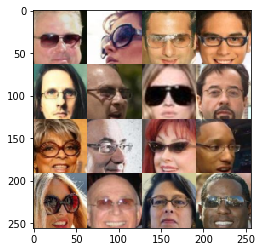

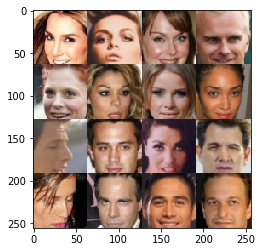

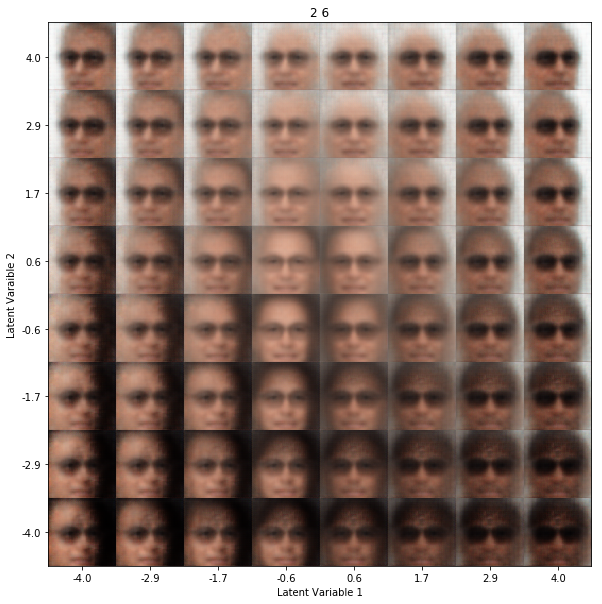

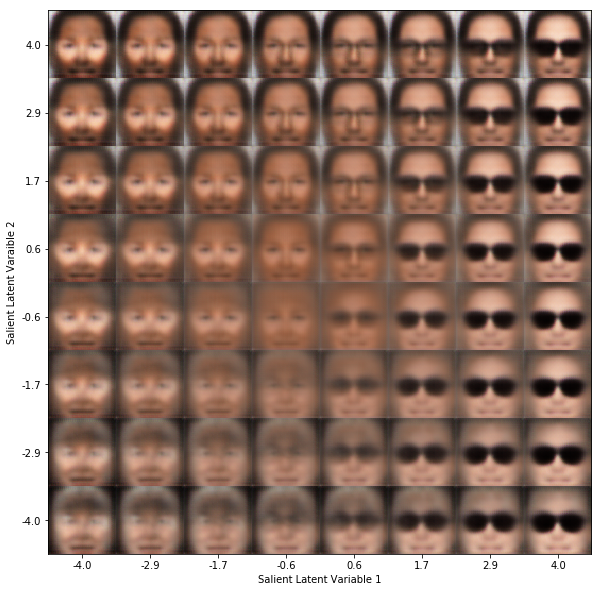

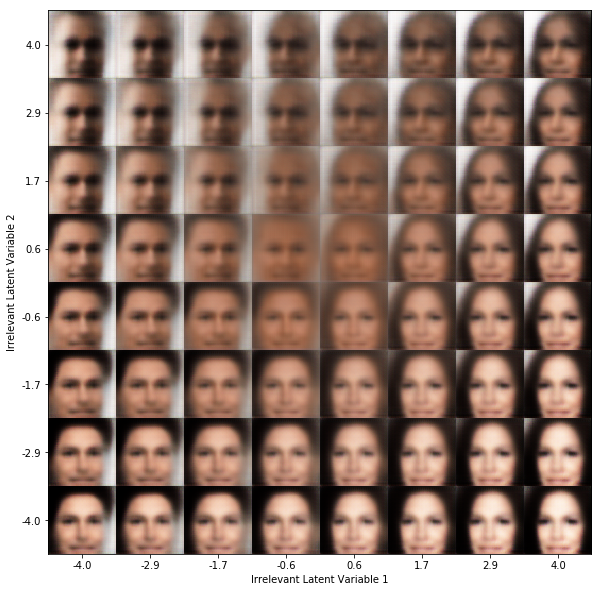

...

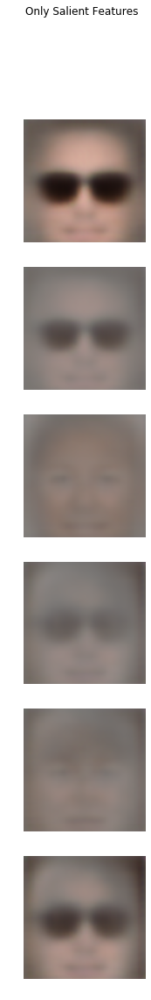

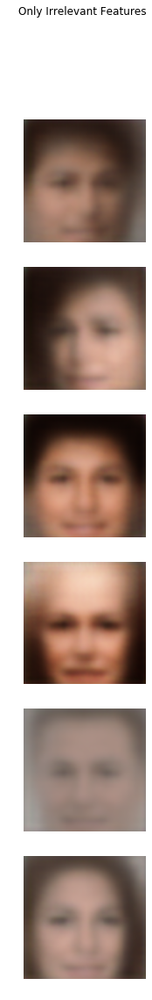

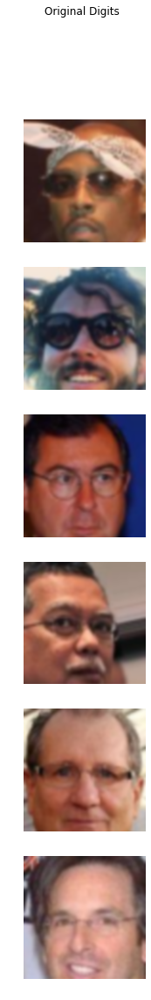

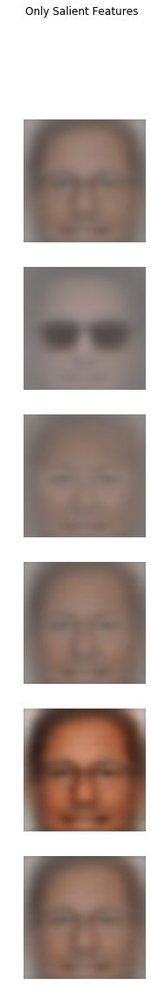

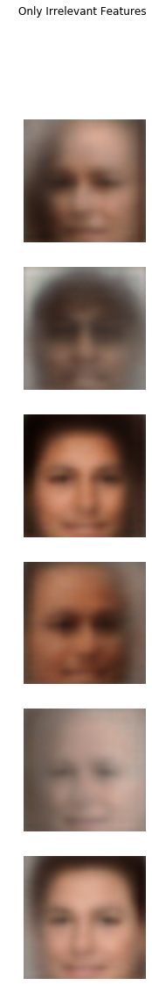

In [8]:
latent_dim = 2
latent_dim_s = 6

standard_and_contrastive_analysis(latent_dim=latent_dim, latent_dim_s=latent_dim_s, width=64, height=64)

0 25 50 75 100 125 150 175 200 225 250 275 300 325 350 375 400 425 450 475 500 525 550 575 600 625 650 675 700 725 750 775 800 825 850 875 900 925 950 975 WARNING:tensorflow:Output "decoder" missing from loss dictionary. We assume this was done on purpose. The fit and evaluate APIs will not be expecting any data to be passed to "decoder".
0 25 50 75 100 125 150 175 200 225 250 275 300 325 350 375 400 425 450 475 500 525 550 575 600 625 650 675 700 725 750 775 800 825 850 875 900 925 950 975 WARNING:tensorflow:Output "decoder" missing from loss dictionary. We assume this was done on purpose. The fit and evaluate APIs will not be expecting any data to be passed to "decoder".
0 25 50 75 100 125 150 175 200 225 250 275 300 325 350 375 400 425 450 475 500 525 550 575 600 625 650 675 700 725 750 775 800 825 850 875 900 925 950 975 

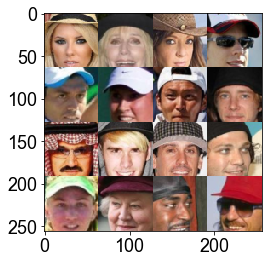

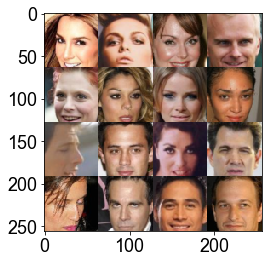

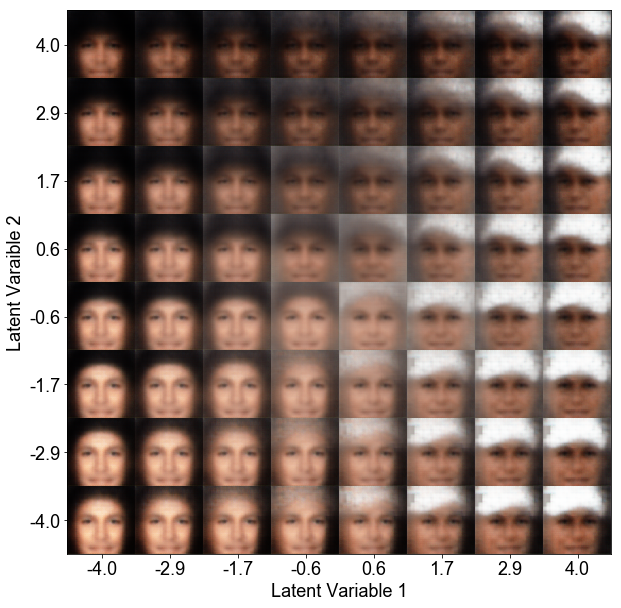

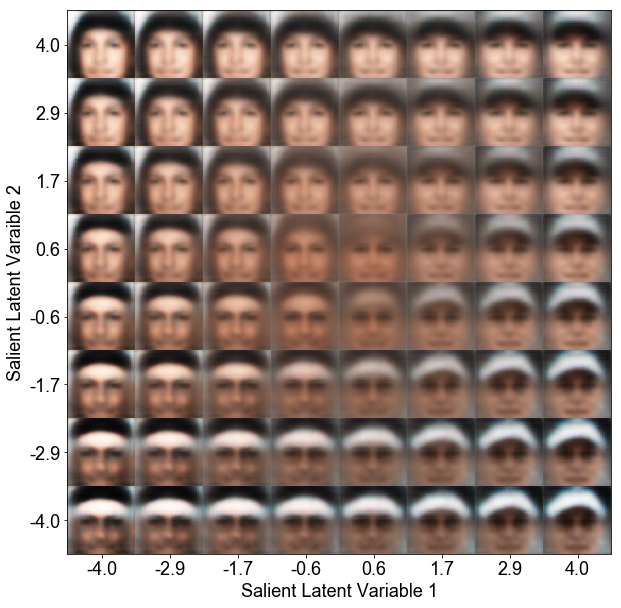

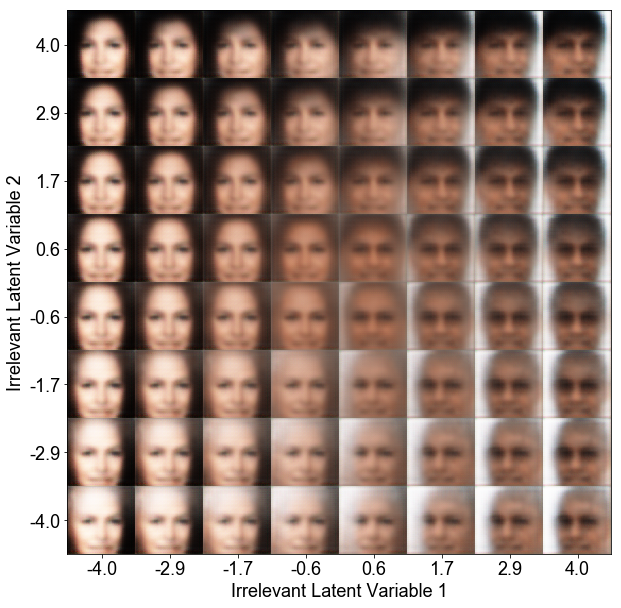

...

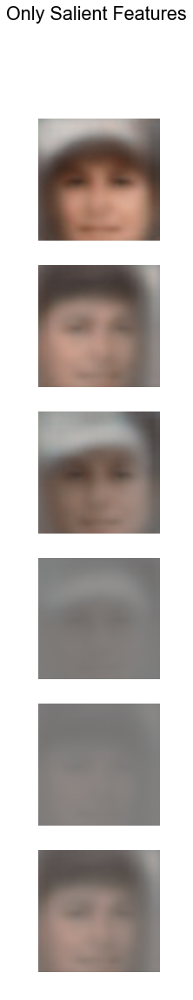

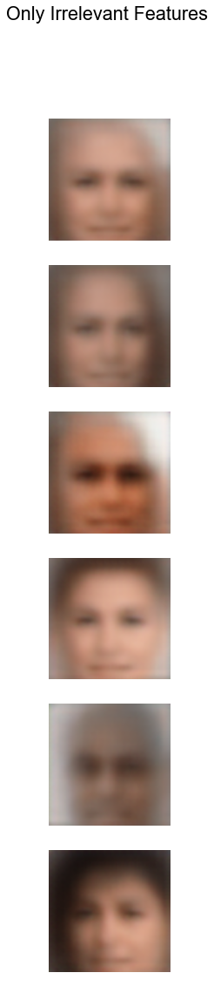

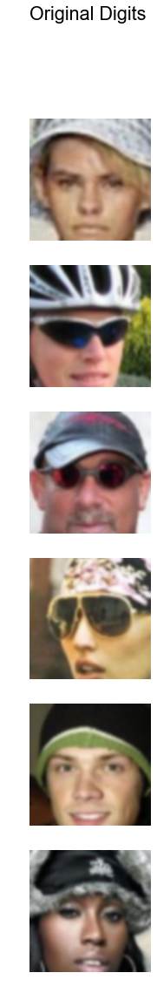

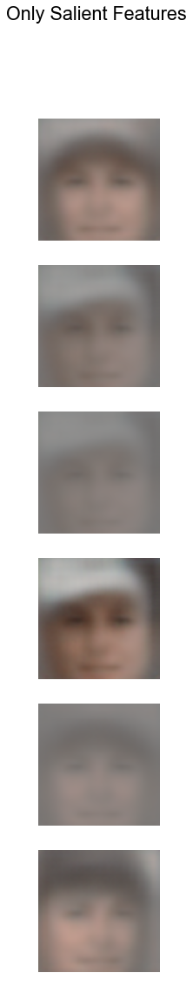

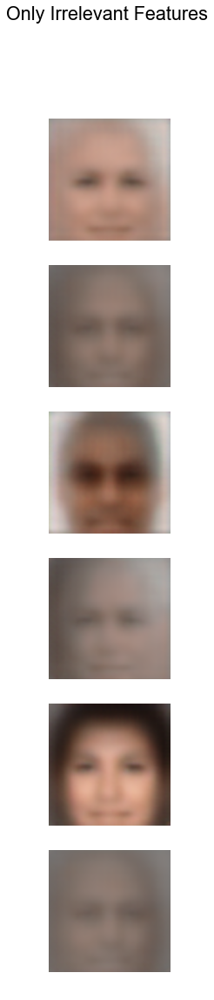

In [5]:
latent_dim = 2
latent_dim_s = 4

standard_and_contrastive_analysis('Wearing_Hat', latent_dim=latent_dim, latent_dim_s=latent_dim_s, width=64, height=64)